In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
from dask.distributed import Client
import s1_rtc_bs_utils
import py3dep
import geopandas as gpd
import rasterio as rio
import pystac
import pystac_client
import stackstac
import math
import shapely
import matplotlib.pyplot as plt
import os
import xarray as xr
from datetime import datetime
import ulmo
from datetime import datetime
import sys
import contextily as ctx


In [24]:
#### CODE FOR DEVELOPMENT-- THIS RELOADS s1_rtc_bs_utils MODULE
#sys.modules.pop('s1_rtc_bs_utils')
#import s1_rtc_bs_utils

In [3]:
# GDAL environment variables for better performance
os.environ['AWS_REGION']='us-west-2'
os.environ['GDAL_DISABLE_READDIR_ON_OPEN']='EMPTY_DIR' 
os.environ['AWS_NO_SIGN_REQUEST']='YES' 
#
xr.set_options(keep_attrs=True)
# Paste /proxy/localhost:8787 for cluster diagnostics
client = Client(local_directory='/tmp', processes=False)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://172.25.45.79:8787/status,
Dashboard: http://172.25.45.79:8787/status,Workers: 1
Total threads: 32,Total memory: 125.71 GiB
Status: running,Using processes: False
Comm: inproc://172.25.45.79/85826/1,Workers: 1
Dashboard: http://172.25.45.79:8787/status,Total threads: 32
Started: Just now,Total memory: 125.71 GiB
Comm: inproc://172.25.45.79/85826/4,Total threads: 32
Dashboard: http://172.25.45.79:44375/status,Memory: 125.71 GiB
Nanny: None,


In [4]:
rainier_bbox_gdf = gpd.read_file('shapefiles/mt_rainier.geojson')

# Test get_s1_rtc_stac()

In [5]:
rainier_sar_ds=s1_rtc_bs_utils.get_s1_rtc_stac(rainier_bbox_gdf,start_time='2015-01-01',end_time=datetime.today().strftime('%Y-%m-%d'),orbit_direction='all',polarization='gamma0_vv',collection='mycollection.json')

In [6]:
%%time
# compute frames, drop missing data
rainier_sar_ds = rainier_sar_ds.compute()
rainier_sar_ds = rainier_sar_ds.dropna('time',how='all')

CPU times: user 17.8 s, sys: 2.01 s, total: 19.8 s
Wall time: 15.4 s


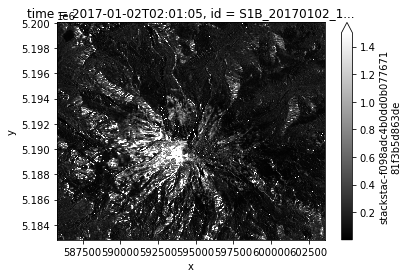

In [7]:
f,ax=plt.subplots()
rainier_sar_ds.isel(time=0).plot(ax=ax,vmax=1.5,cmap='gray')

In [8]:
#np.array(rainier_sar_ds['time'])

In [9]:
#f,ax=plt.subplots(figsize=(30,1))
#f,ax=plt.subplots()
#ax.scatter(np.array(rainier_sar_ds['time']),rainier_sar_ds.coords['sat:orbit_state'])

Text(0.5, 1.0, 'Relative Orbits')

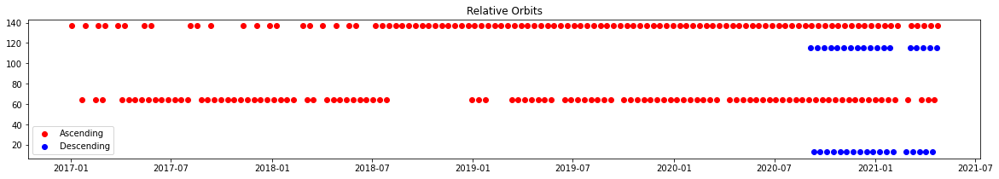

In [10]:
f,ax=plt.subplots(figsize=(20,3))
ax.scatter(np.array(rainier_sar_ds[rainier_sar_ds.coords['sat:orbit_state']=='ascending'].time),rainier_sar_ds[rainier_sar_ds.coords['sat:orbit_state']=='ascending']['sat:relative_orbit'],label='Ascending',c='red')
ax.scatter(np.array(rainier_sar_ds[rainier_sar_ds.coords['sat:orbit_state']=='descending'].time),rainier_sar_ds[rainier_sar_ds.coords['sat:orbit_state']=='descending']['sat:relative_orbit'],label='Descending',c='blue')
ax.legend()
ax.set_title('Relative Orbits')

# Test get_py3dep_dem(), get_py3dep_aspect(), get_py3dep_slope(), get_dah()

RasterioIOError: '/vsimem/ab19b5e1-a859-4d23-a699-6b8016a8d47a/ab19b5e1-a859-4d23-a699-6b8016a8d47a.tif' not recognized as a supported file format.

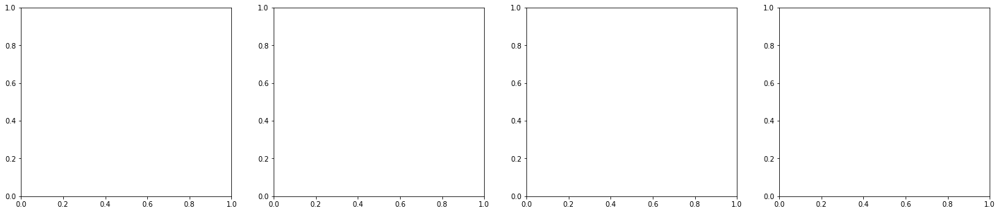

In [11]:
f,ax=plt.subplots(1,4,figsize=(25,5))
s1_rtc_bs_utils.get_py3dep_dem(rainier_sar_ds).plot(ax=ax[0])

In [ ]:
s1_rtc_bs_utils.get_py3dep_aspect(rainier_sar_ds).plot(ax=ax[1])

In [ ]:
s1_rtc_bs_utils.get_py3dep_slope(rainier_sar_ds).plot(ax=ax[2])

In [ ]:
s1_rtc_bs_utils.get_dah(rainier_sar_ds).plot(ax=ax[3])

# Test get_median_ndvi()

In [ ]:
dem = s1_rtc_bs_utils.get_py3dep_dem(rainier_sar_ds)
summer_ndvi_ds = s1_rtc_bs_utils.get_median_ndvi(rainier_sar_ds)

In [ ]:
f,ax=plt.subplots()
summer_ndvi_ds.plot(ax=ax)

# Test plot_backscatter_ts_and_ndvi()

In [ ]:
s1_rtc_bs_utils.plot_backscatter_ts_and_ndvi(rainier_sar_ds,summer_ndvi_ds)

# Test get_runoff_onset(), get_ripening_onset()

In [ ]:
f,ax=plt.subplots(1,2,figsize=(20,7))
s1_rtc_bs_utils.get_runoff_onset(rainier_sar_ds).dt.dayofyear.plot(ax=ax[0],cmap='twilight')
s1_rtc_bs_utils.get_ripening_onset(rainier_sar_ds).dt.dayofyear.plot(ax=ax[1],cmap='twilight')

# Test get_stats()

In [18]:
rainier_glaciers = gpd.read_file('shapefiles/rainier_glaciers.geojson').to_crs(rainier_sar_ds.crs)

In [ ]:
stats_full_df = s1_rtc_bs_utils.get_stats(rainier_sar_ds)
stats_ndvi_mask_df = s1_rtc_bs_utils.get_stats(rainier_sar_ds.where(summer_ndvi_ds<0.2,drop=True))
stats_glacier_mask_df = s1_rtc_bs_utils.get_stats(rainier_sar_ds.rio.clip(rainier_glaciers.geometry,rainier_glaciers.crs,drop=False,invert=False))

In [ ]:
stats_full_df.corr()

In [ ]:
stats_ndvi_mask_df.corr()

In [ ]:
stats_glacier_mask_df.corr()

In [ ]:
f,ax=plt.subplots(1,3,figsize=(30,10))
color1=ax[0].scatter(stats_full_df['dah'],stats_full_df['elevation'],c=stats_full_df['runoff_dates'],s=0.01,cmap='twilight')
color2=ax[1].scatter(stats_ndvi_mask_df['dah'],stats_ndvi_mask_df['elevation'],c=stats_ndvi_mask_df['runoff_dates'],s=0.01,cmap='twilight')
color3=ax[2].scatter(stats_glacier_mask_df['dah'],stats_glacier_mask_df['elevation'],c=stats_glacier_mask_df['runoff_dates'],s=0.01,cmap='twilight')

ax[0].set_title('Runoff Onset Day as a function of DAH and Elevation \n Full Scene')
ax[0].set_xlabel('DAH')
ax[0].set_ylabel('Elevation [m]')
ax[0].set_facecolor('xkcd:grey')

ax[1].set_title('Runoff Onset Day as a function of DAH and Elevation \n with NDVI<0.2 Mask')
ax[1].set_xlabel('DAH')
ax[1].set_ylabel('Elevation [m]')
ax[1].set_facecolor('xkcd:grey')

ax[2].set_title('Runoff Onset Day as a function of DAH and Elevation \n with Glacier Mask')
ax[2].set_xlabel('DAH')
ax[2].set_ylabel('Elevation [m]')
ax[2].set_facecolor('xkcd:grey')

plt.colorbar(color1,ax=ax[0])
plt.colorbar(color2,ax=ax[1])
plt.colorbar(color3,ax=ax[2])

In [ ]:
f,ax = plt.subplots(1,2,figsize=(20,8))
color0 = ax[0].hexbin(stats_glacier_mask_df['dah'],stats_glacier_mask_df['elevation'])
f.colorbar(color0,ax=ax[0])
ax[0].set_title('DAH and Elevation Histogram')
ax[0].set_xlabel('DAH')
ax[0].set_ylabel('Elevation')
ax[0].set_facecolor('xkcd:grey')
color1 = ax[1].hexbin(stats_glacier_mask_df['dah'],stats_glacier_mask_df['elevation'],bins='log')
f.colorbar(color1,ax=ax[1])
ax[1].set_title('DAH and Elevation Histogram (log scale)')
ax[1].set_xlabel('DAH')
ax[1].set_ylabel('Elevation')
ax[1].set_facecolor('xkcd:grey')

In [ ]:
# this plpot is tricky because we need to reduce in some way, but since the values are cylical, most reductions seem invalid
grid_size = 40
f,ax = plt.subplots(1,4,figsize=(40,8))
color0 = ax[0].hexbin(stats_glacier_mask_df['dah'],stats_glacier_mask_df['elevation'],C=stats_glacier_mask_df['runoff_dates'],gridsize=grid_size,cmap='twilight',reduce_C_function=np.mean)
ax[0].set_title('Runoff Onset Day as a function of DAH and Elevation \n Reduced by np.mean')
ax[0].set_xlabel('DAH')
ax[0].set_ylabel('Elevation [m]')
ax[0].set_facecolor('xkcd:grey')
f.colorbar(color0,ax=ax[0])

color1 = ax[1].hexbin(stats_glacier_mask_df['dah'],stats_glacier_mask_df['elevation'],C=stats_glacier_mask_df['runoff_dates'],gridsize=grid_size,cmap='twilight',reduce_C_function=np.median)
ax[1].set_title('Runoff Onset Day as a function of DAH and Elevation \n Reduced by np.median')
ax[1].set_xlabel('DAH')
ax[1].set_ylabel('Elevation [m]')
ax[1].set_facecolor('xkcd:grey')
f.colorbar(color1,ax=ax[1])

color2 = ax[2].hexbin(stats_glacier_mask_df['dah'],stats_glacier_mask_df['elevation'],C=stats_glacier_mask_df['runoff_dates'],gridsize=grid_size,cmap='twilight',reduce_C_function=np.min)
ax[2].set_title('Runoff Onset Day as a function of DAH and Elevation \n Reduced by np.min')
ax[2].set_xlabel('DAH')
ax[2].set_ylabel('Elevation [m]')
ax[2].set_facecolor('xkcd:grey')
f.colorbar(color2,ax=ax[2])

color3 = ax[3].hexbin(stats_glacier_mask_df['dah'],stats_glacier_mask_df['elevation'],C=stats_glacier_mask_df['runoff_dates'],gridsize=grid_size,cmap='twilight',reduce_C_function=np.max)
ax[3].set_title('Runoff Onset Day as a function of DAH and Elevation \n Reduced by np.max')
ax[3].set_xlabel('DAH')
ax[3].set_ylabel('Elevation [m]')
ax[3].set_facecolor('xkcd:grey')
f.colorbar(color3,ax=ax[3])

In [ ]:
f,ax=plt.subplots(2,2,figsize=(15,15))
stats_glacier_mask_ds = stats_glacier_mask_df.to_xarray() 
stats_glacier_mask_ds['runoff_prediction'].plot(cmap='twilight',ax=ax[0,1],vmin=0,vmax=365)
stats_glacier_mask_ds['runoff_dates'].plot(cmap='twilight',ax=ax[0,0],vmin=0,vmax=365)
ax[0,0].set_title('SAR Backscatter Derived DOY Runoff Onset Date')
ax[0,1].set_title('MLS Predicted DOY Runoff Onset Date')
ax[0,0].set_facecolor('xkcd:grey')
ax[0,1].set_facecolor('xkcd:grey')
stats_glacier_mask_ds['ripening_prediction'].plot(cmap='twilight',ax=ax[1,1],vmin=0,vmax=365)
stats_glacier_mask_ds['ripening_dates'].plot(cmap='twilight',ax=ax[1,0],vmin=0,vmax=365)
ax[1,0].set_title('SAR Backscatter Derived DOY Ripening Date')
ax[1,1].set_title('MLS Predicted DOY Ripening Date')
ax[1,0].set_facecolor('xkcd:grey')
ax[1,1].set_facecolor('xkcd:grey')

# Test plot_timeseries_by_elevation_bin(), plot_hyposometry()

In [ ]:
resample_freq_s1='2W'
rainier_sar_2w_ds = rainier_sar_ds.where(summer_ndvi_ds.values<0.2).resample(time='2W').mean(dim='time')

In [ ]:
f,ax=plt.subplots(4,2,figsize=(24,18),gridspec_kw={'width_ratios': [1, 8]})
s1_rtc_bs_utils.plot_timeseries_by_elevation_bin(rainier_sar_ds,dem,bin_size=100,ax=ax[0,1],normalize_bins=False)
s1_rtc_bs_utils.plot_timeseries_by_elevation_bin(rainier_sar_ds,dem,bin_size=100,ax=ax[1,1],normalize_bins=True)
s1_rtc_bs_utils.plot_hyposometry(rainier_sar_ds,dem,bin_size=100,ax=ax[0,0])
s1_rtc_bs_utils.plot_hyposometry(rainier_sar_ds,dem,bin_size=100,ax=ax[1,0])
s1_rtc_bs_utils.plot_timeseries_by_elevation_bin(rainier_sar_2w_ds,dem,bin_size=100,ax=ax[2,1],normalize_bins=False)
s1_rtc_bs_utils.plot_timeseries_by_elevation_bin(rainier_sar_2w_ds,dem,bin_size=100,ax=ax[3,1],normalize_bins=True)
s1_rtc_bs_utils.plot_hyposometry(rainier_sar_2w_ds,dem.where(summer_ndvi_ds.values<0.2),bin_size=100,ax=ax[2,0])
s1_rtc_bs_utils.plot_hyposometry(rainier_sar_2w_ds,dem.where(summer_ndvi_ds.values<0.2),bin_size=100,ax=ax[3,0])
ax[0,0].invert_xaxis()
ax[1,0].invert_xaxis()
ax[2,0].invert_xaxis()
ax[3,0].invert_xaxis()
#plt.tight_layout()
f.tight_layout(rect=[0, 0.03, 1, 0.95])
f.suptitle("Mt. Rainier Sentinel-1 SAR Backscatter binned by Elevation \n (Runoff onset happens at the backscatter minimum / darkest pixels) \n each row: backscatter means for a given 100m elevation bin \n top 2 rows are all data, bottom 2 rows are 2 week resampled means")

# Test plot_timeseries_by_dah_bin(), plot_dah_bins()

In [ ]:
dah = s1_rtc_bs_utils.get_dah(rainier_sar_ds)

In [ ]:
bin_size = 0.1
f,ax=plt.subplots(2,4,figsize=(24,18),sharex=True,gridspec_kw={'height_ratios': [8, 1]})
s1_rtc_bs_utils.plot_timeseries_by_dah_bin(rainier_sar_ds,dah,bin_size=bin_size,ax=ax[0,0],normalize_bins=False)
s1_rtc_bs_utils.plot_timeseries_by_dah_bin(rainier_sar_ds,dah,bin_size=bin_size,ax=ax[0,1],normalize_bins=True)
s1_rtc_bs_utils.plot_timeseries_by_dah_bin(rainier_sar_2w_ds,dah,bin_size=bin_size,ax=ax[0,2],normalize_bins=False)
s1_rtc_bs_utils.plot_timeseries_by_dah_bin(rainier_sar_2w_ds,dah,bin_size=bin_size,ax=ax[0,3],normalize_bins=True)

s1_rtc_bs_utils.plot_dah_bins(rainier_sar_ds,dah,bin_size=bin_size,ax=ax[1,0])
s1_rtc_bs_utils.plot_dah_bins(rainier_sar_ds,dah,bin_size=bin_size,ax=ax[1,1])
s1_rtc_bs_utils.plot_dah_bins(rainier_sar_2w_ds,dah,bin_size=bin_size,ax=ax[1,2])
s1_rtc_bs_utils.plot_dah_bins(rainier_sar_2w_ds,dah,bin_size=bin_size,ax=ax[1,3])

ax[0,0].set_title('Mean Backscatter')
ax[0,1].set_title('Normalized (DAH-wise) Backscatter')
ax[0,2].set_title('2 Week Resampled Mean Backscatter')
ax[0,3].set_title('2 Week Resampled Normalized (DAH-wise) Backscatter')
#plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.tight_layout()
f.suptitle("Mt. Rainier Sentinel-1 SAR Backscatter binned by DAH \n (Runoff onset happens at the backscatter minimum / darkest pixels) \n each column: backscatter for a given 0.25 DAH bin \n (DAH = 1 has greatest insolation, DAH = -1 has the least insolation)")

# Test find_closest_snotel()

In [12]:
s1_rtc_bs_utils.find_closest_snotel(rainier_sar_ds)

,code,name,elevation_m,geometry,distance_km
SNOTEL:679_WA_SNTL,679_WA_SNTL,Paradise,1563.624023,POINT (595595.572 5181772.683),1.037317
SNOTEL:941_WA_SNTL,941_WA_SNTL,Mowich,963.168030,POINT (579756.913 5197732.382),6.033087
SNOTEL:1085_WA_SNTL,1085_WA_SNTL,Cayuse Pass,1597.151978,POINT (611700.715 5191709.650),8.130715
SNOTEL:942_WA_SNTL,942_WA_SNTL,Burnt Mountain,1271.015991,POINT (580495.481 5210642.884),11.860238
SNOTEL:642_WA_SNTL,642_WA_SNTL,Morse Lake,1648.968018,POINT (615555.470 5195819.019),11.985470
...,...,...,...,...,...
SNOTEL:1177_AK_SNTL,1177_AK_SNTL,Prudhoe Bay,9.144000,POINT (-438458.080 7996787.513),2978.411777
SNOTEL:986_AK_SNTL,986_AK_SNTL,Pargon Creek,30.480000,POINT (-1285933.578 7807093.295),3209.381277
SNOTEL:973_AK_SNTL,973_AK_SNTL,Rocky Point,76.199997,POINT (-1330776.287 7774460.473),3209.504415
SNOTEL:1036_AK_SNTL,1036_AK_SNTL,Johnsons Camp,7.620000,POINT (-1362951.239 7803978.992),3252.405689


# Test plot_closest_snotel()

<AxesSubplot:title={'center':'SNOTEL Sites Around Study Site'}, xlabel='x', ylabel='y'>

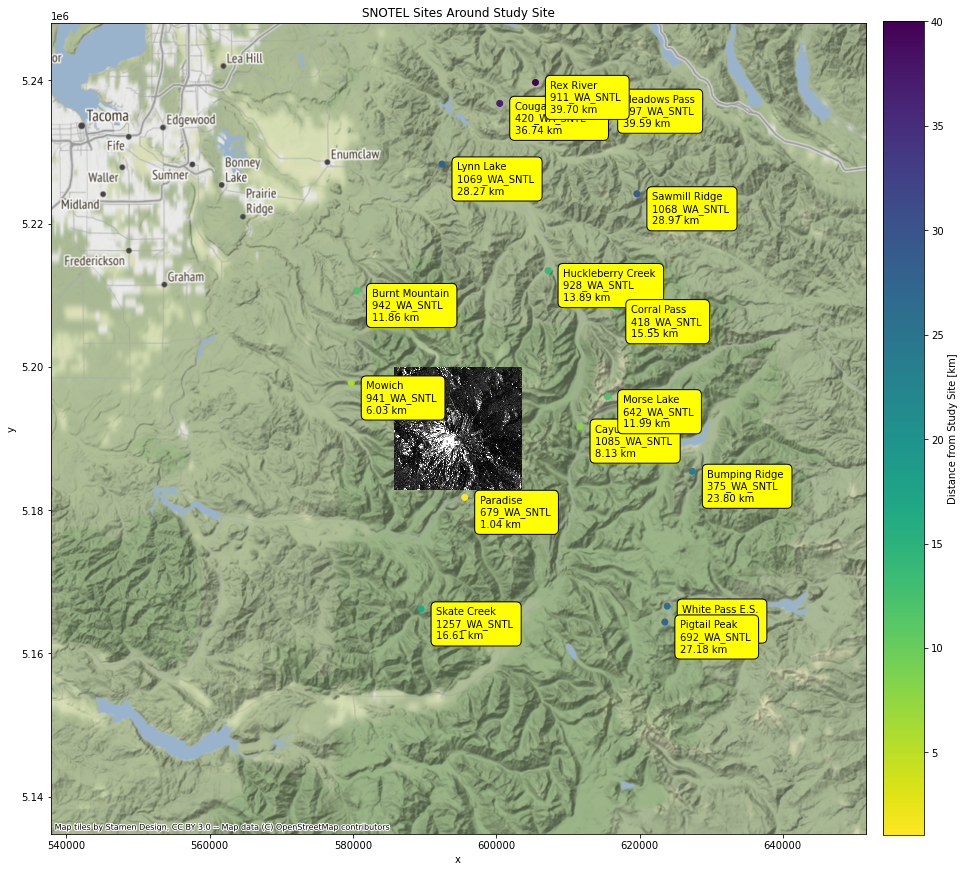

In [13]:
f, ax = plt.subplots(figsize=(15,15))
s1_rtc_bs_utils.plot_closest_snotel(rainier_sar_ds,distance_cutoff=40,ax=ax)

# Test get_snotel()

In [14]:
sitecode = 'SNOTEL:679_WA_SNTL'
#variablecode = 'SNOTEL:TAVG_D'
#variablecode = 'SNOTEL:PRCPSA_D'
#variablecode = 'SNOTEL:WTEQ_D'
values_df = s1_rtc_bs_utils.get_snotel(sitecode, variable_code='SNOTEL:SNWD_D',start_date='1900-01-01', end_date=datetime.today().strftime('%Y-%m-%d'))
values_df['value'] = 2.54*values_df['value'] #inches to cm
values_df

,value,qualifiers,censor_code,date_time_utc,method_id,method_code,source_code,quality_control_level_code
datetime,,,,,,,,
2006-08-18 00:00:00+00:00,0.00,E,nc,2006-08-18T00:00:00,0,0,1,1
2006-08-19 00:00:00+00:00,0.00,E,nc,2006-08-19T00:00:00,0,0,1,1
2006-08-20 00:00:00+00:00,0.00,E,nc,2006-08-20T00:00:00,0,0,1,1
2006-08-21 00:00:00+00:00,0.00,E,nc,2006-08-21T00:00:00,0,0,1,1
2006-08-22 00:00:00+00:00,0.00,E,nc,2006-08-22T00:00:00,0,0,1,1
...,...,...,...,...,...,...,...,...
2022-06-18 00:00:00+00:00,251.46,V,nc,2022-06-18T00:00:00,0,0,1,1
2022-06-19 00:00:00+00:00,248.92,V,nc,2022-06-19T00:00:00,0,0,1,1
2022-06-20 00:00:00+00:00,243.84,V,nc,2022-06-20T00:00:00,0,0,1,1


# Test get_closest_snotel_data()

In [15]:
snotel_data = s1_rtc_bs_utils.get_closest_snotel_data(rainier_sar_ds,variable_code='SNOTEL:SNWD_D',distance_cutoff=30,start_date='1900-01-01', end_date=datetime.today().strftime('%Y-%m-%d'))

Text(0.5, 1.0, 'Snow Depth for SNOTEL Stations Close in Proximety to Dataset')

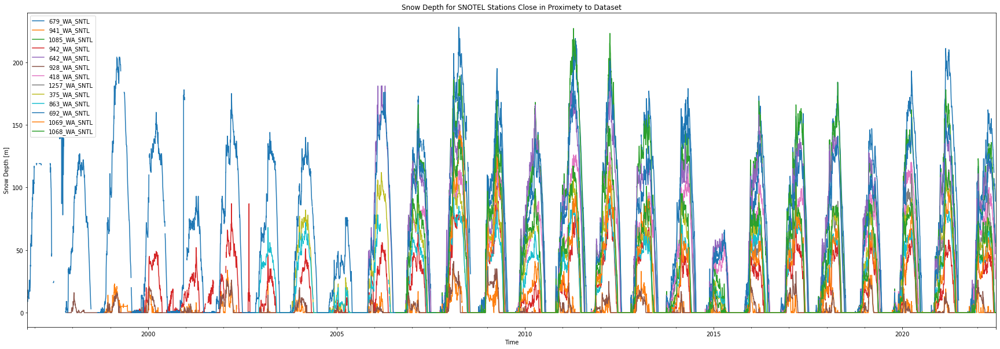

In [16]:
f, ax = plt.subplots(figsize=(30,10))
snotel_data.plot(ax=ax)
ax.set_xlabel('Time')
ax.set_ylabel('Snow Depth [m]')
ax.set_title('Snow Depth for SNOTEL Stations Close in Proximety to Dataset')

# Test get_s2_ndsi()

In [ ]:
snow=s1_rtc_bs_utils.get_s2_ndsi(rainier_sar_ds.where(summer_ndvi_ds.values<0.2))

In [ ]:
snow.plot.imshow(col="time", col_wrap = 10, robust=True);

In [ ]:
f,ax = plt.subplots(figsize=(20,8))
ax.plot(snow.time,snow.mean(dim=['x','y']))

In [ ]:
f,ax=plt.subplots(figsize=(20,8))
s1_rtc_bs_utils.plot_timeseries_by_elevation_bin(snow,dem,ax=ax,normalize_bins=True)
ax.set_title('NDSI Values binned by elevation')

# Test get_s2_rgb()

In [ ]:
snow_rgb=s1_rtc_bs_utils.get_s2_rgb(rainier_sar_ds)

In [ ]:
snow_rgb.where(summer_ndvi_ds.rio.reproject_match(snow_rgb).values<0.2).plot.imshow(col="time", col_wrap = 10, rgb='band', robust=True,aspect=1);

# Test plot_bs_ndsi_swe_precip()

In [35]:
rainier_sar_2020_ds=s1_rtc_bs_utils.get_s1_rtc_stac(rainier_bbox_gdf,start_time='2020-01-01',end_time='2021-01-01',orbit_direction='all',polarization='gamma0_vv',collection='mycollection.json')
rainier_sar_2020_ds = rainier_sar_2020_ds.compute()
rainier_sar_2020_ds = rainier_sar_2020_ds.dropna('time',how='all')
rainier_sar_2020_glaciers_ds = rainier_sar_2020_ds.rio.clip(rainier_glaciers.geometry,rainier_glaciers.crs,drop=False,invert=False)
rainier_sar_2020_nisqually_ds = rainier_sar_2020_ds.rio.clip(rainier_glaciers[rainier_glaciers.Name=='Nisqually Glacier WA'].geometry,rainier_glaciers[rainier_glaciers.Name=='Nisqually Glacier WA'].crs,drop=False,invert=False)

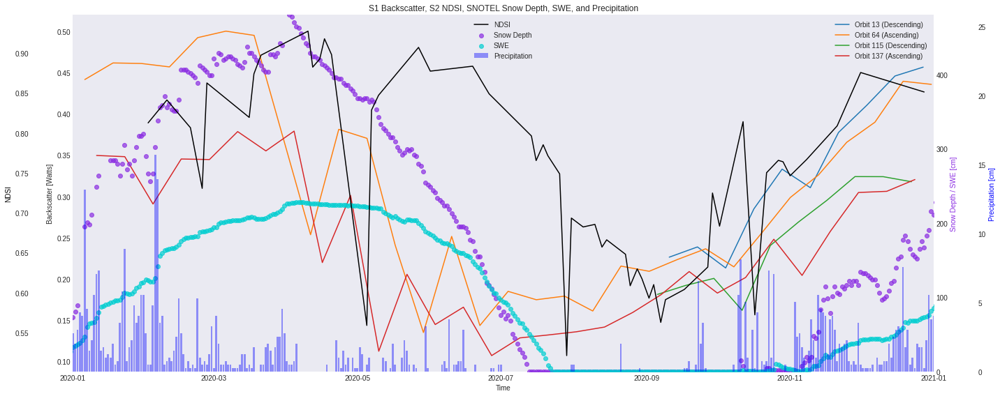

In [22]:
f,ax=plt.subplots(figsize=(20,8))
s1_rtc_bs_utils.plot_bs_ndsi_swe_precip(rainier_sar_2020_glaciers_ds,ax=ax,start_date='2020-01-01',end_date='2021-01-01')

distributed.utils_perf - WARNING - full garbage collections took 12% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)


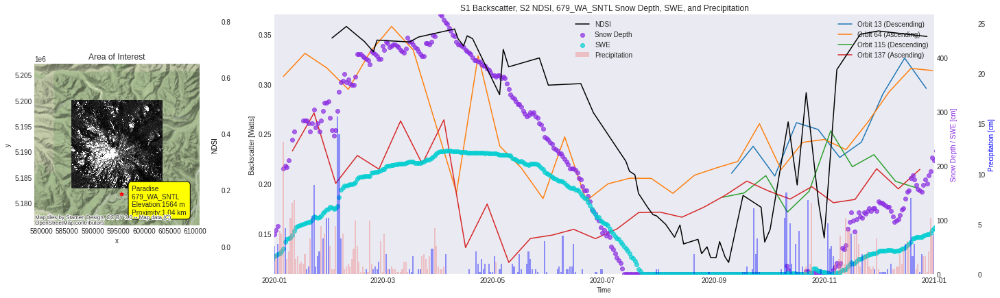

In [26]:
s1_rtc_bs_utils.plot_bs_ndsi_swe_precip_with_context(rainier_sar_2020_ds,start_date='2020-01-01',end_date='2021-01-01')

distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)


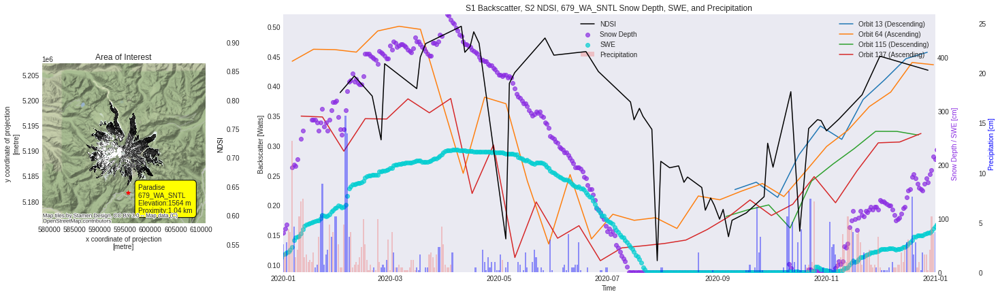

In [25]:
s1_rtc_bs_utils.plot_bs_ndsi_swe_precip_with_context(rainier_sar_2020_glaciers_ds,start_date='2020-01-01',end_date='2021-01-01')

distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)


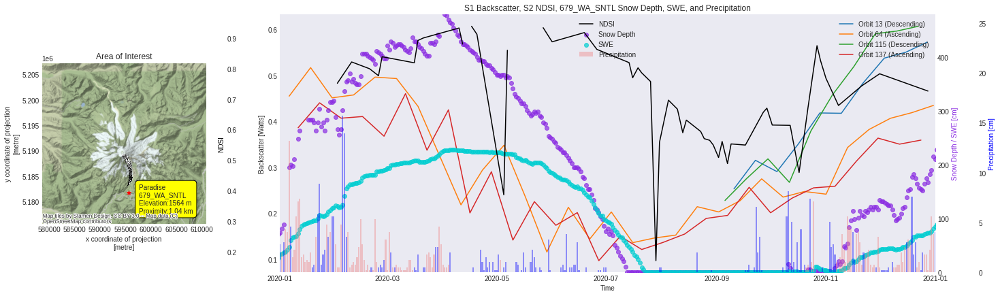

In [36]:
s1_rtc_bs_utils.plot_bs_ndsi_swe_precip_with_context(rainier_sar_2020_nisqually_ds,start_date='2020-01-01',end_date='2021-01-01')

In [ ]:
# left pane should have meltmap

# aggregate_by_doy() #averages and such

# predict_runoff_with_ndsi()

In [ ]:
# TODO .melt_onset_elevation_line() .aggregate_by_time() .plot_gif() .plot_runoff() .plot_ripening() 